## Google Drive Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Download Data % Remove Unnecessary Files

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("moeeznisar/helmet-wearing-and-voilation-detect-using-yolov8")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'helmet-wearing-and-voilation-detect-using-yolov8' dataset.
Path to dataset files: /kaggle/input/helmet-wearing-and-voilation-detect-using-yolov8


In [ ]:
# Create destination folder in Drive
!mkdir -p /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/

In [ ]:
# Copy dataset from Kaggle input directory to Google Drive project folder
!cp -r /kaggle/input/helmet-wearing-and-voilation-detect-using-yolov8/* /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/

In [ ]:
pwd

'/content'

## Remove Extra Files from Helmet Detection Dataset (Kaggle)

In [ ]:
# Clean up Kaggle data folder by removing notebook, readme files, and pretrained weights

%cd /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/Helmet\ Detect\ \ Using\ YOLO-V8\ Final/

!rm Helmet_detect.ipynb README.dataset.txt README.roboflow.txt best.pt

/content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/Helmet Detect  Using YOLO-V8 Final


## Reorganize Kaggle Dataset - Move Files to Root Directory

In [ ]:
# Navigate to the folder
%cd /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/

# Move everything from the subfolder to current directory
!mv "Helmet Detect  Using YOLO-V8 Final"/* .

# Remove the now-empty folder
!rmdir "Helmet Detect  Using YOLO-V8 Final"

# Verify
!ls

/content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data
 data.yaml   test   train   valid  'video test'


In [ ]:
%cd /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector

/content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector


## Collect All `jpeg images` from Dataset Subdirectories

In [ ]:
from pathlib import Path

# Path object to the dataset folder
dataset_image_path = Path("kaggle_data")

# Recursively find all .jpg files in 'Helmet Detect' and all its subfolders (test, train, valid)
images_paths_lst = list(dataset_image_path.glob("**/*.jpg"))

In [ ]:
len(images_paths_lst)

629

## Dataset Cleanup: Remove `_png.rf.*` from Image Names

In [ ]:
# Flag to track if we've already printed the "already desired format" message
already_desired_format = False

for path in images_paths_lst:

    # Check if filename contains "_png" (needs cleaning)
    if "_png" in path.stem:

        # Extract clean filename: remove everything after "_png" from the stem
        clean_name = path.stem.split("_png")[0]

        # Create new path with same parent directory, clean name and original extensions which is .jpg
        new_path = path.parent / (clean_name + path.suffix)

        # Rename only if the new name is different from the old name
        if path.name != new_path.name:

            # rename the file
            path.rename(new_path)
            print(f'Renamed: {path.name} -> {new_path.name}')

    elif not already_desired_format:
        print("Already desired format")
        already_desired_format = True

Renamed: BikesHelmets185_png.rf.eedc55a04760ef0df1a8511eab1e5a1d.jpg -> BikesHelmets185.jpg
Renamed: BikesHelmets310_png.rf.46a911f2fdb1b84625501b2df6244a2a.jpg -> BikesHelmets310.jpg
Renamed: BikesHelmets290_png.rf.ecff5fefe58165ded06d006c638741d7.jpg -> BikesHelmets290.jpg
Renamed: BikesHelmets27_png.rf.2fa881e720f4a4a8c1e56994929fe772.jpg -> BikesHelmets27.jpg
Renamed: BikesHelmets323_png.rf.33b8bb5e34917c16717cdf05730ce8df.jpg -> BikesHelmets323.jpg
Renamed: BikesHelmets486_png.rf.e85b83d2165680ab4bf94951f14de139.jpg -> BikesHelmets486.jpg
Renamed: BikesHelmets43_png.rf.96f6f2a6959453af5d0c7d47d315606c.jpg -> BikesHelmets43.jpg
Renamed: BikesHelmets507_png.rf.c0b19f2a5c3f7291b88f8129075ecb46.jpg -> BikesHelmets507.jpg
Renamed: BikesHelmets282_png.rf.7b3a4107f76d97ed3801a059de3ef0aa.jpg -> BikesHelmets282.jpg
Renamed: BikesHelmets4_png.rf.eeff27e4b617e98466cad48861537a70.jpg -> BikesHelmets4.jpg
Renamed: BikesHelmets114_png.rf.413336efe7d5ab80e4c159c78d29933d.jpg -> BikesHelmets114.

## Collect All `txt files` from Dataset Subdirectories

In [ ]:
from pathlib import Path

# Path object to the dataset folder
dataset_label_path = Path("kaggle_data")

# Recursively find all .txt files in 'Helmet Detect' and all its subfolders (test, train, valid)
labels_paths_lst = list(dataset_label_path.glob("**/*.txt"))

## Dataset Cleanup: Remove `_png.rf.*` from TXT Names

In [ ]:
# Flag to track if we've already printed the "already desired format" message
already_desired_format = False

for path in labels_paths_lst:

    # Check if filename contains "_png" (needs cleaning)
    if "_png" in path.stem:

        # Extract clean filename: remove everything after "_png" from the stem
        clean_name = path.stem.split("_png")[0]

        # Create new path with same parent directory, clean name and original extensions which is .txt
        new_path = path.parent / (clean_name + path.suffix)

        # Rename only if the new name is different from the old name
        if path.name != new_path.name:

            # rename the file
            path.rename(new_path)
            print(f'Renamed: {path.name} -> {new_path.name}')

    elif not already_desired_format:
        print("Already desired format")
        already_desired_format = True

Renamed: BikesHelmets243_png.rf.f0a33adbd5eab26e80589bde6da1f205.txt -> BikesHelmets243.txt
Renamed: BikesHelmets197_png.rf.9fc09ed23fbc4622ce7c31bca2e416b6.txt -> BikesHelmets197.txt
Renamed: BikesHelmets576_png.rf.8d213af50ef4cc8dd9d0038d3b7b908e.txt -> BikesHelmets576.txt
Renamed: BikesHelmets0_png.rf.8fa86155da3b8694006a2c0b79daf7be.txt -> BikesHelmets0.txt
Renamed: BikesHelmets152_png.rf.a652fe6cc2cfb4fb6d9fe29b75509c39.txt -> BikesHelmets152.txt
Renamed: BikesHelmets319_png.rf.1b8408c7f07ac40e45a320e850433f08.txt -> BikesHelmets319.txt
Renamed: BikesHelmets14_png.rf.61a3b9ba497921be33e9255410d69d0f.txt -> BikesHelmets14.txt
Renamed: BikesHelmets626_png.rf.2b542207c468130a0ecdcfc3791ca9db.txt -> BikesHelmets626.txt
Renamed: BikesHelmets671_png.rf.0dfdb4f4d9da92b2dbea484600ad459a.txt -> BikesHelmets671.txt
Renamed: BikesHelmets251_png.rf.73d9b0cd6c34075cd9b64ec2f7c85b48.txt -> BikesHelmets251.txt
Renamed: BikesHelmets36_png.rf.6a6301fa7fb9fe550e96b0aceb59253d.txt -> BikesHelmets36.

## Load YAML Dataset Config & Override Relative Paths to Absolute

In [ ]:
import yaml

data_config = yaml.safe_load(open('kaggle_data/data.yaml'))

# Override relative paths with absolute paths for YOLO training
data_config["train"] = 'kaggle_data/train/images'
data_config["val"] = 'kaggle_data/valid/images'
data_config["test"] = 'kaggle_data/test/images'

data_config

{'train': 'kaggle_data/train/images',
 'val': 'kaggle_data/valid/images',
 'test': 'kaggle_data/test/images',
 'nc': 2,
 'names': ['With Helmet', 'Without Helmet'],
 'roboflow': {'workspace': 'moeezs-workspace-gsui5',
  'project': 'helmet-detect-j6idy',
  'version': 1,
  'license': 'CC BY 4.0',
  'url': 'https://universe.roboflow.com/moeezs-workspace-gsui5/helmet-detect-j6idy/dataset/1'}}

In [ ]:
class_names = data_config["names"]
class_names

['With Helmet', 'Without Helmet']

## Visualize YOLO Training Samples with Bounding Boxes


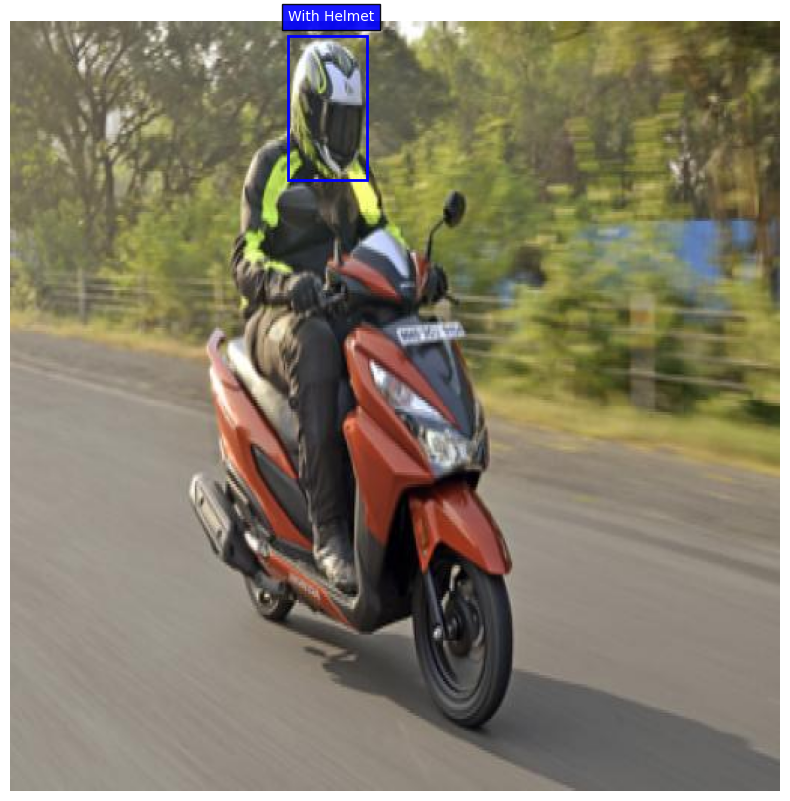

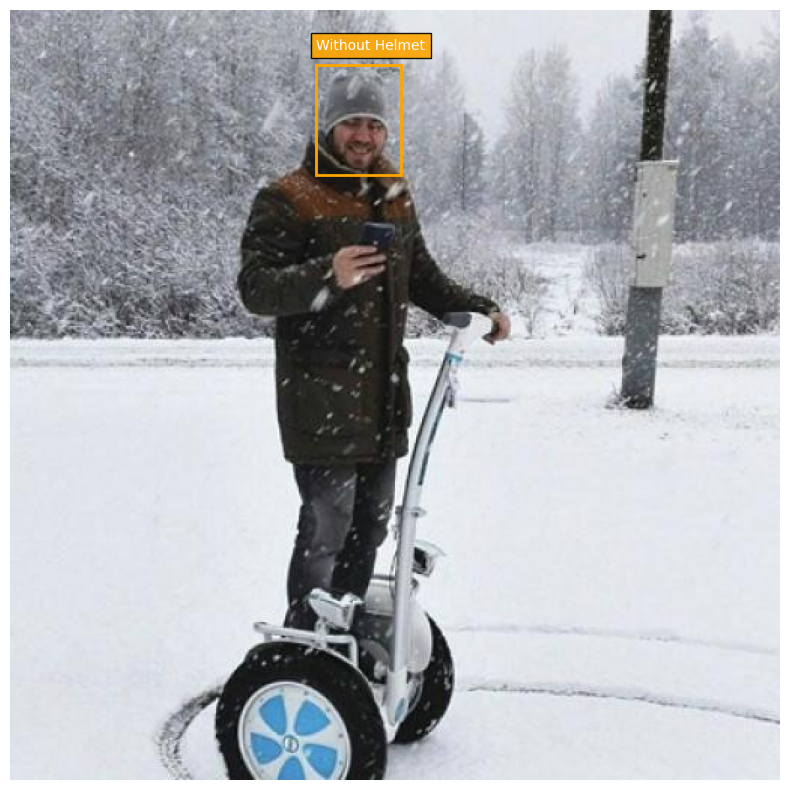

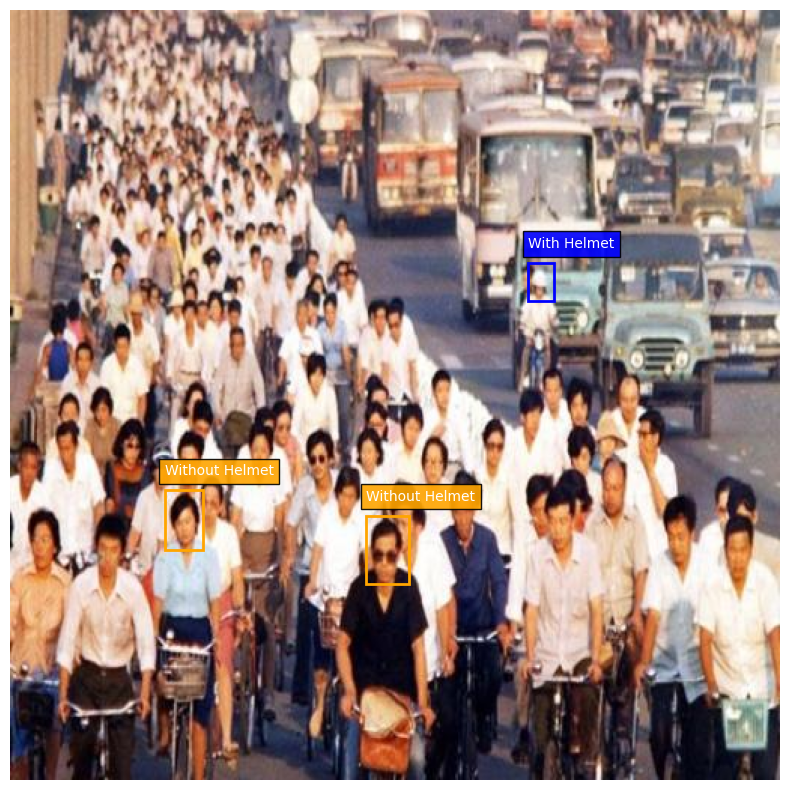

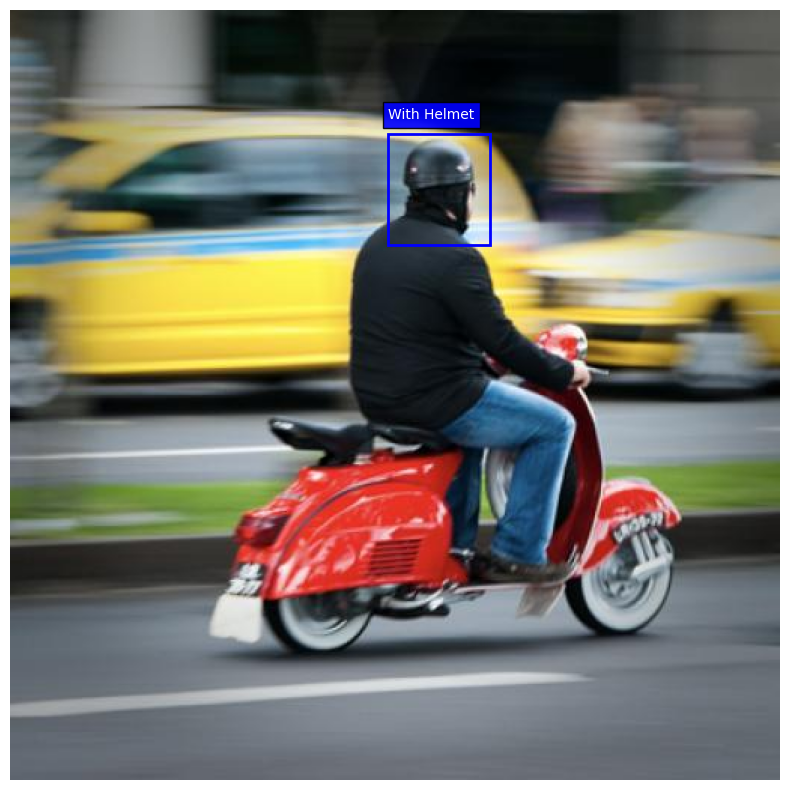

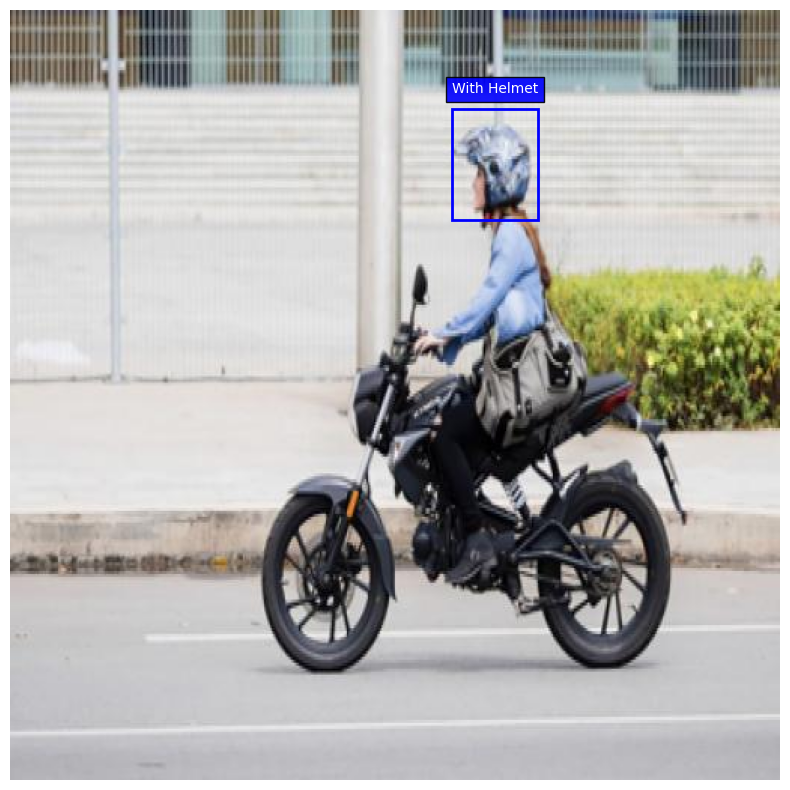

In [ ]:
import glob
import cv2
import matplotlib.pyplot as plt
import os
from pathlib import Path
import random

# Get class names from YAML config
class_names = data_config["names"]

# Get training images directory path
train_path = data_config['train']

all_images_path = glob.glob(f"{train_path}/*.jpg")
# Load first 10 sample images from training folder
sample_images = random.choices(all_images_path, k=5)

for img_path in sample_images:

    # Load and Convert image (BGR to RGB)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get image dimensions: height, width (ignore channels)
    h, w, _ = img.shape

    # Convert string path to Path object for easy manipulation
    image_path = Path(img_path)

    # Goes from: train/images/BikesHelmets2.jpg → train/labels/BikesHelmets2.txt
    label_path = image_path.parent.parent / "labels" / (image_path.stem + ".txt")

    # If label exists: draw bounding boxes
    if os.path.exists(label_path):
        plt.figure(figsize=(10, 10))
        plt.imshow(img)

        # Gets the current axes (canvas) so you can draw on it.
        ax = plt.gca()

        # Parse YOLO format: class x_center, y_center, width, height (normalized 0-1)
        with open(label_path) as f:
            for line in f:

                # Split line into 5 numbers: class_id, center_x, center_y, box_width, box_height
                # line.split() -> list of strings -> ["0", "0.5", "0.3", "0.2", "0.1"]
                # map(float, line.split()) -> list of floats -> [0.0, 0.5, 0.3, 0.2, 0.1]
                cls, xc, yc, bw, bh = map(float, line.split())

                # Scale normalized YOLO coordinates to absolute pixel values
                # (center_x, center_y, width, height) -> (x1, y1, x2, y2)

                # Left edge = (center - half_width) × image_width
                x1 = (xc - bw/2) * w

                # Right edge = (center + half_width) × image_width
                x2 = (xc + bw/2) * w

                # Top edge = (center - half_height) × image_height
                y1 = (yc - bh/2) * h

                # Bottom edge = (center + half_height) × image_height
                y2 = (yc + bh/2) * h

                # Color coding: Blue for helmet (class 0), Orange for no-helmet (class 1)
                if int(cls) == 0:
                    color = "blue"
                else:
                    color = "orange"

                # Create rectangle: top-left corner (x1,y1), width (x2-x1), height (y2-y1)
                rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                                     fill=False,        # Don't fill inside, just show outline
                                     edgecolor=color,   # Border color (unique per class)
                                     linewidth=2)

                # Add the rectangle to the axes (image) so it appears on the plot (Draw the rectangle on the canvas)
                ax.add_patch(rect)

                # Draw class label with colored background above bounding box
                plt.text(x1, y1-10,                    # Position: above box (10 pixels up)
                         class_names[int(cls)],
                         color='white',
                         fontsize=10,
                         bbox=dict(facecolor=color,    # Box background: same color as bounding box
                                   alpha=0.9))

        plt.axis('off')
        plt.show()

## Install Ultralytics

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 21.6 MB/s eta 0:00:00


## YOLOv8(n) Training Script

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

results = model.train(
    data=r"kaggle_data/data.yaml",
    epochs=50,
    batch=16,
    imgsz=640,
    device=0,                           # GPU device(0 = first GPU)
    patience=10                         # early stopping if no improvement
)

Ultralytics 8.4.74 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kaggle_data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective

## Training Results Analysis


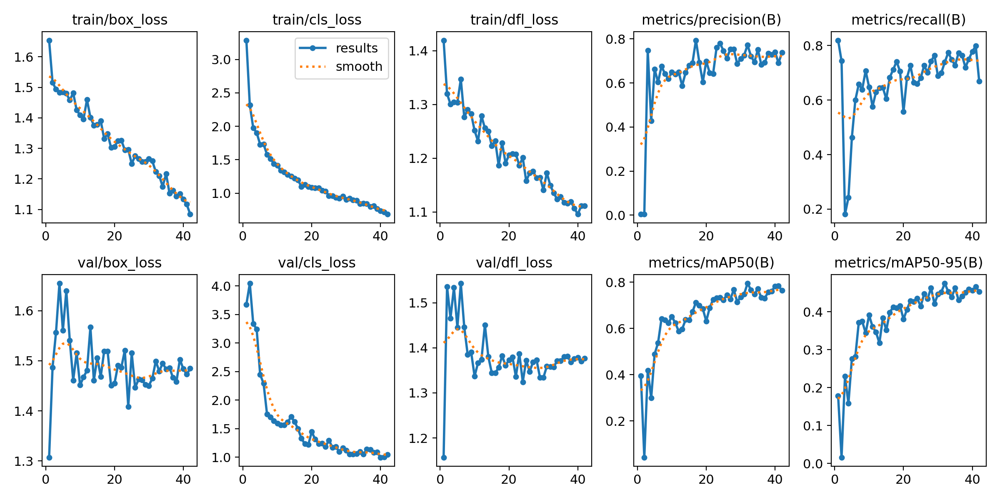

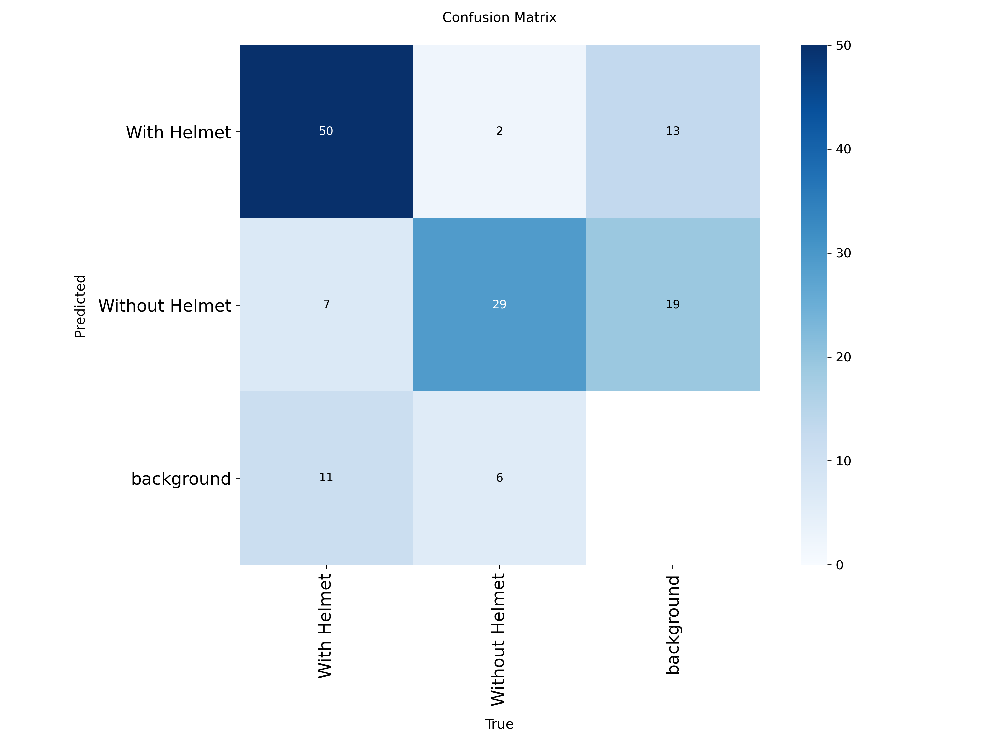

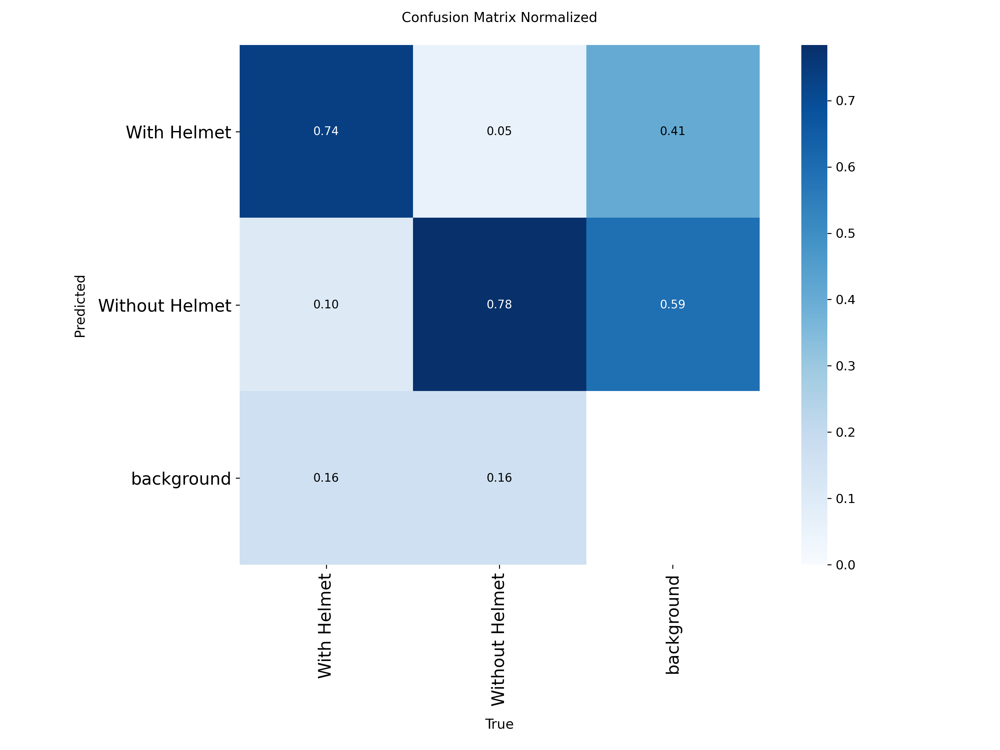

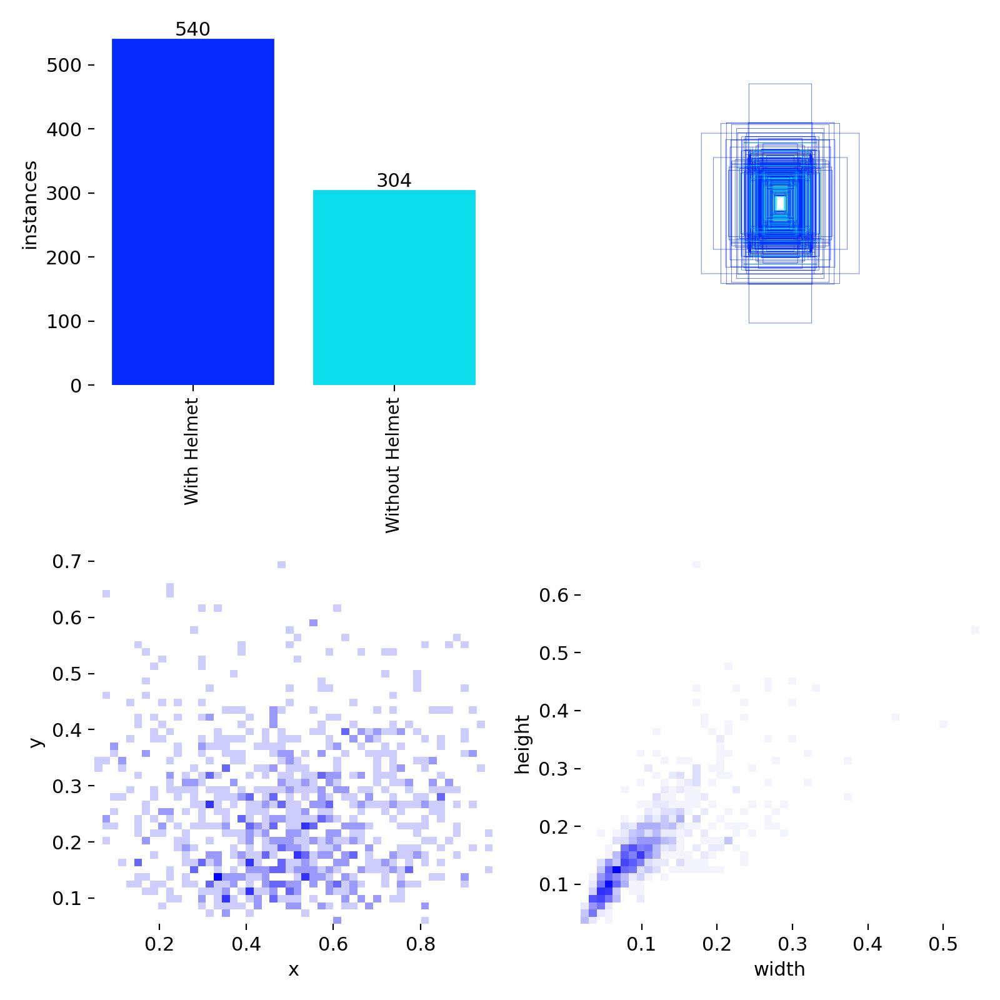

In [ ]:
from pathlib import Path
from IPython.display import Image, display

# Define path to the training results folder
results_path = Path("runs/detect/train")

# Display training results plot (loss curves and metrics over epochs)
display(Image(filename=str(results_path / "results.png")))

# Display raw confusion matrix (counts of predictions vs actual classes)
display(Image(filename=str(results_path / "confusion_matrix.png")))

# Display normalized confusion matrix (percentages for easier comparison)
display(Image(filename=str(results_path / "confusion_matrix_normalized.png")))

# Display sample training images with ground truth labels (data quality check)
display(Image(filename=str(results_path / "labels.jpg")))

<details>
<summary>🔍 Background Meaning in YOLO Confusion Matrix</summary>

#### 🤔 What is "**Background**"?
- 🖼️ `Background` = any area in an image that `does NOT contain` a target object.
- 🚫 It is treated as the `no object` or `negative class` during training/evaluation.

---

#### 🧪 In YOLO Specifically:
- YOLO treats background as `class 0` internally.
- The confusion matrix helps you see if your model confuses specific objects with background.
- Useful for diagnosing false detections in cluttered scenes.

</details>

<details>
<summary>📊 IoU vs Confidence Score – Key Differences</summary>

#### 🧠 What is IoU?
- 📐 Measures **overlap** between predicted and ground-truth boxes.
- 🔢 Range: `0.0` (no overlap) – `1.0` (perfect).
- 📏 Formula: `IoU = Intersection / Union`

---

#### 🎯 What is Confidence Score?
- 🧠 Measures **model certainty** that an object exists.
- 🔢 Range: `0.0` – `1.0`.
- 🗑️ Used to filter weak detections (e.g., keep `> 0.5`).

---

#### ⚖️ Key Differences:

| Feature | `IoU` | `Confidence` |
|---------|-------|---------------|
| Measures | Box overlap | Model certainty |
| Type | Spatial | Probabilistic |
| Used for | Evaluation / NMS | Filtering predictions |
| Compares | Prediction vs GT | Prediction only |

---

#### 🔧 How They Work Together:
1. 🧪 Model outputs boxes + confidence scores.
2. 🗑️ Discard low-confidence boxes.
3. 📏 Apply `IoU` in NMS to remove duplicates.
4. ✅ Keep high-confidence, high-IoU detections.

</details>

<details>
<summary>📊 Dataset Analysis Report – What Each Plot Shows</summary>

### 🔝 Top-Left – Class Balance (Bar Chart)
- 📊 Shows **number of instances per class**.
- ✅ Helps you check if dataset is **balanced** or **imbalanced**.

---

### 🔝 Top-Right – Bounding Box Overlay
- 🖼️ All annotated boxes drawn on **one combined image**.
- 📍 Shows **where objects usually appear** (center, edges, etc.).

---

### 🔻 Bottom-Left – Box Centers (Scatter Plot)
- 📌 Plots `(x, y)` center of every bounding box.
- 🎯 Shows if objects are **spread out** or **concentrated** in specific areas.

---

### 🔻 Bottom-Right – Box Sizes (Scatter Plot)
- 📐 Plots `width` vs `height` of each box.
- 📏 Shows **size range** and **aspect ratio** of objects.

</details>

## Training and Validation Batch Samples


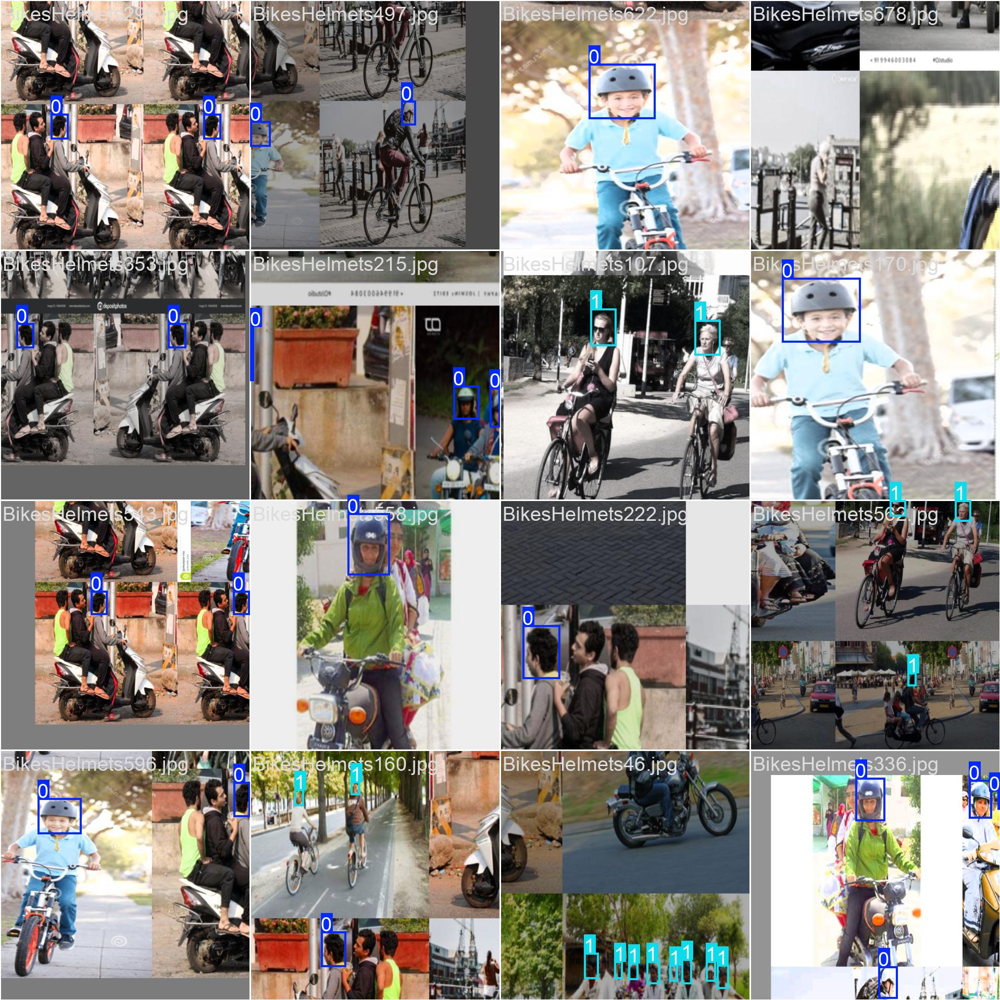

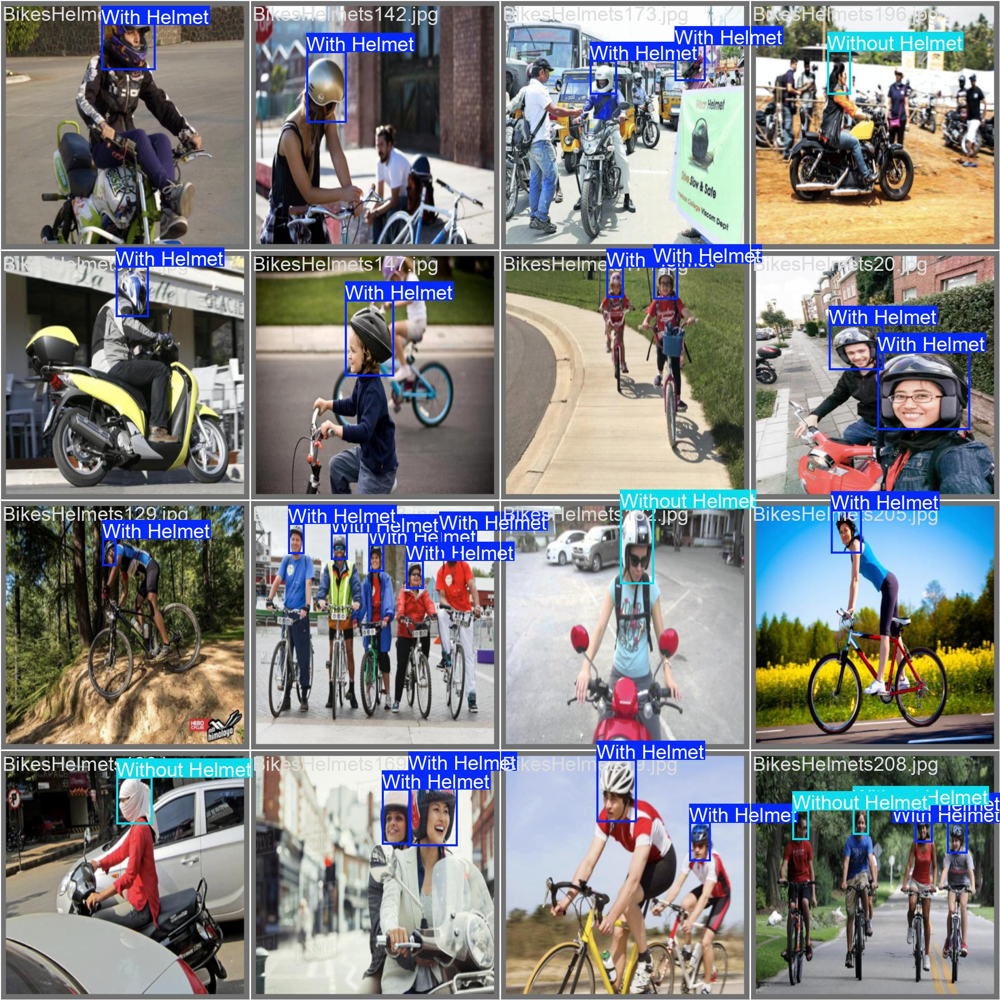

In [ ]:
from IPython.display import Image, display

# Display sample training batch (images with ground truth labels from training set)
display(Image(filename=str(results_path / "train_batch0.jpg")))

# Display sample validation batch with ground truth labels (for comparison)
display(Image(filename=str(results_path / "val_batch0_labels.jpg")))

## Loading Trained YOLOv8 Model


In [3]:
from ultralytics import YOLO
from pathlib import Path

# Define path to the best model weights from training
model_path = Path("runs/detect/train/weights/best.pt")

# Load the trained YOLO model
model = YOLO(model_path)

print(f"Model loaded successfully from: {model_path}")

Model loaded successfully from: runs\detect\train\weights\best.pt


## Model Validation Test Results

In [4]:
test_results = model.val(data="kaggle_data/data.yaml", split="test")

Ultralytics 8.4.66  Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 4.01.0 ms, read: 0.20.3 MB/s, size: 38.7 KB)
val: Scanning G:\My Drive\repos\computer-vision-projects\yolo-helmet-detector\kaggle_data\test\labels... 128 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 7.3it/s 17.6s0.1ss
val: New cache created: G:\My Drive\repos\computer-vision-projects\yolo-helmet-detector\kaggle_data\test\labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.0s/it 8.2s0.4ss
                   all        128        231      0.681      0.741       0.75      0.466
           With Helmet         98        177       0.86      0.797      0.899      0.573
        Without Helmet         33         54      0.502      0.685      0.601      0.359
Speed: 5.0ms preprocess, 7.2ms in

## Model Evaluation Results Visualization

Precision: 0.6809
Recall: 0.7409
mAP50: 0.7498
mAP50-95: 0.4661


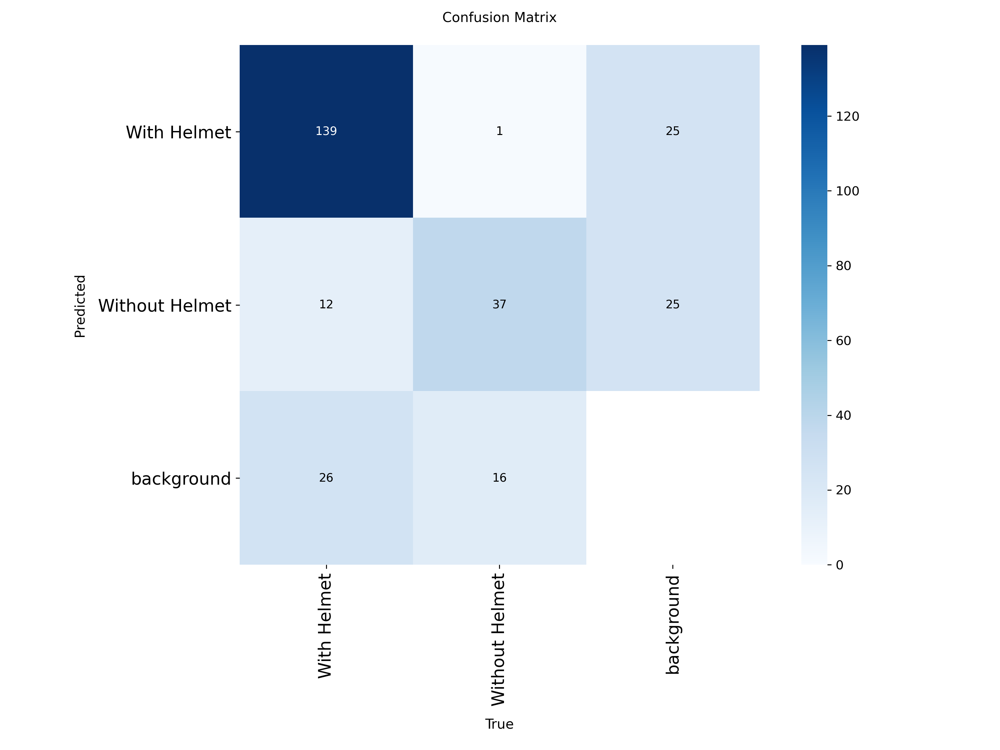

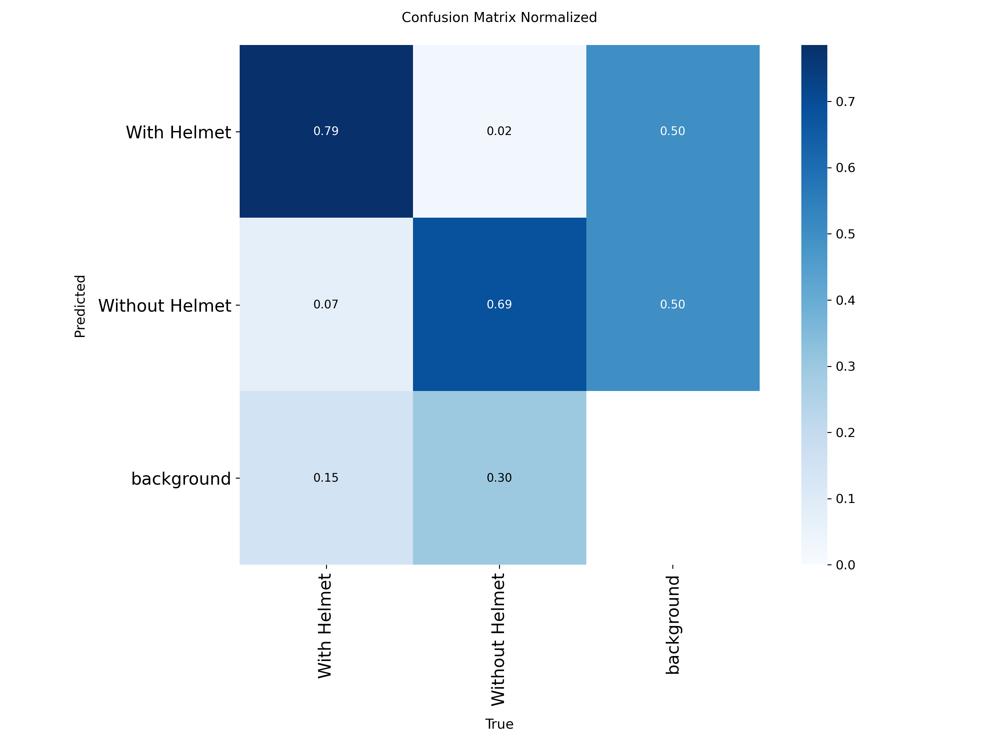

In [5]:
from pathlib import Path
from IPython.display import Image, display

# Define path to the test results folder
test_results_path = Path("runs/detect/val")

# Print key detection metrics: Precision, Recall, mAP50 and mAP50-95
print(f"Precision: {test_results.results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {test_results.results_dict['metrics/recall(B)']:.4f}")
print(f"mAP50: {test_results.results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP50-95: {test_results.results_dict['metrics/mAP50-95(B)']:.4f}")

# Display raw confusion matrix (counts of predictions vs actual classes)
display(Image(filename=str(test_results_path / "confusion_matrix.png")))

# Display normalized confusion matrix (percentages for easier comparison)
display(Image(filename=str(test_results_path / "confusion_matrix_normalized.png")))

## Per-Class Validation Performance Metrics

In [6]:
from pprint import pprint

print("With Helmet")
pprint(test_results.summary()[0])
print("\nWithout Helmet")
pprint(test_results.summary()[1])

With Helmet
{'Box-F1': np.float64(0.82707),
 'Box-P': np.float64(0.85995),
 'Box-R': np.float64(0.79661),
 'Class': 'With Helmet',
 'Images': np.int64(98),
 'Instances': np.int64(177),
 'mAP50': np.float64(0.89901),
 'mAP50-95': np.float64(0.57328)}

Without Helmet
{'Box-F1': np.float64(0.57935),
 'Box-P': np.float64(0.50183),
 'Box-R': np.float64(0.68519),
 'Class': 'Without Helmet',
 'Images': np.int64(33),
 'Instances': np.int64(54),
 'mAP50': np.float64(0.60064),
 'mAP50-95': np.float64(0.35898)}


## Ground Truth vs Model Predictions: Validation Batch Comparison

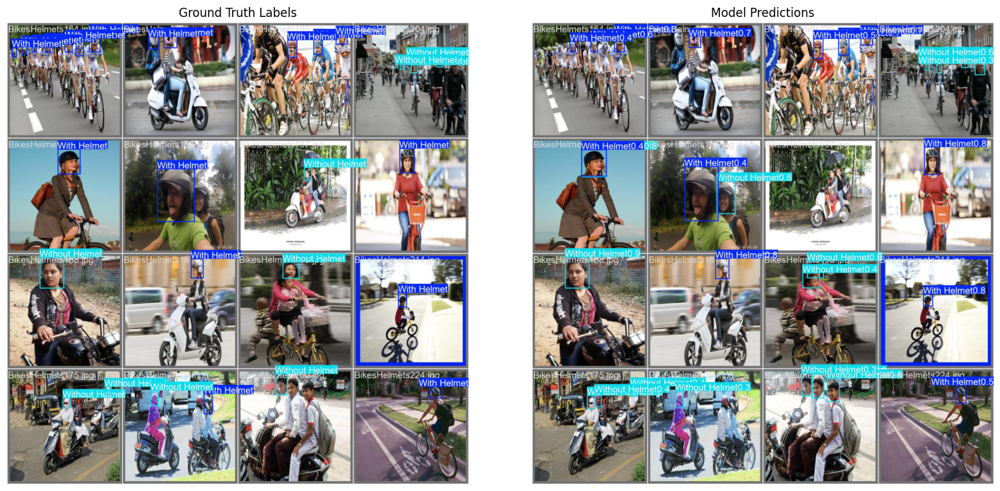

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
from pathlib import Path

# Path to val results
results_path = Path("runs/detect/val")

# Load images
labels_img = plt.imread(results_path / "val_batch1_labels.jpg")
pred_img = plt.imread(results_path / "val_batch1_pred.jpg")

# Display side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(labels_img)
axes[0].set_title("Ground Truth Labels")

axes[0].axis('off')

axes[1].imshow(pred_img)
axes[1].set_title("Model Predictions")
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [8]:
%cd /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector

/content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector


## YOLOv8`m` Training Script

In [10]:
from ultralytics import YOLO

model_m = YOLO('yolov8m.pt')

results_m = model_m.train(
    data=r"kaggle_data/data.yaml",
    epochs=50,
    batch=8,
    imgsz=640,
    device=0,                           # GPU device(0 = first GPU)
    patience=10                         # early stopping if no improvement
)

Ultralytics 8.4.80 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kaggle_data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, persp

## Training `results_m` Analysis


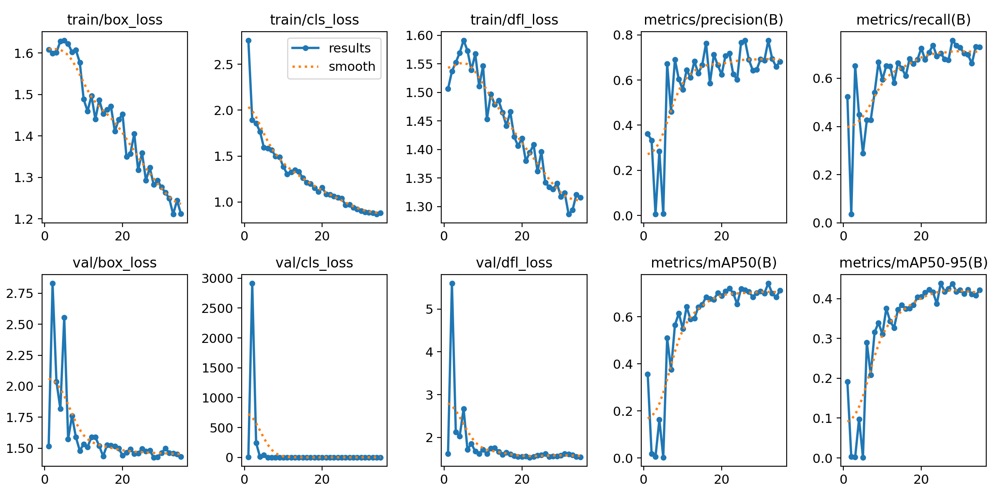

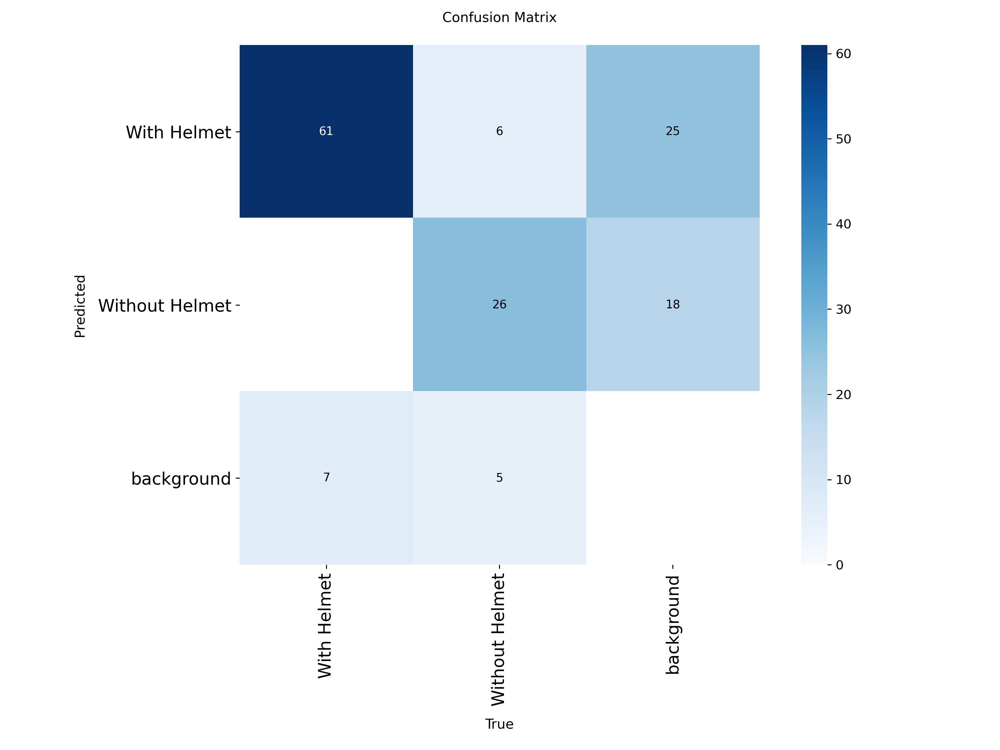

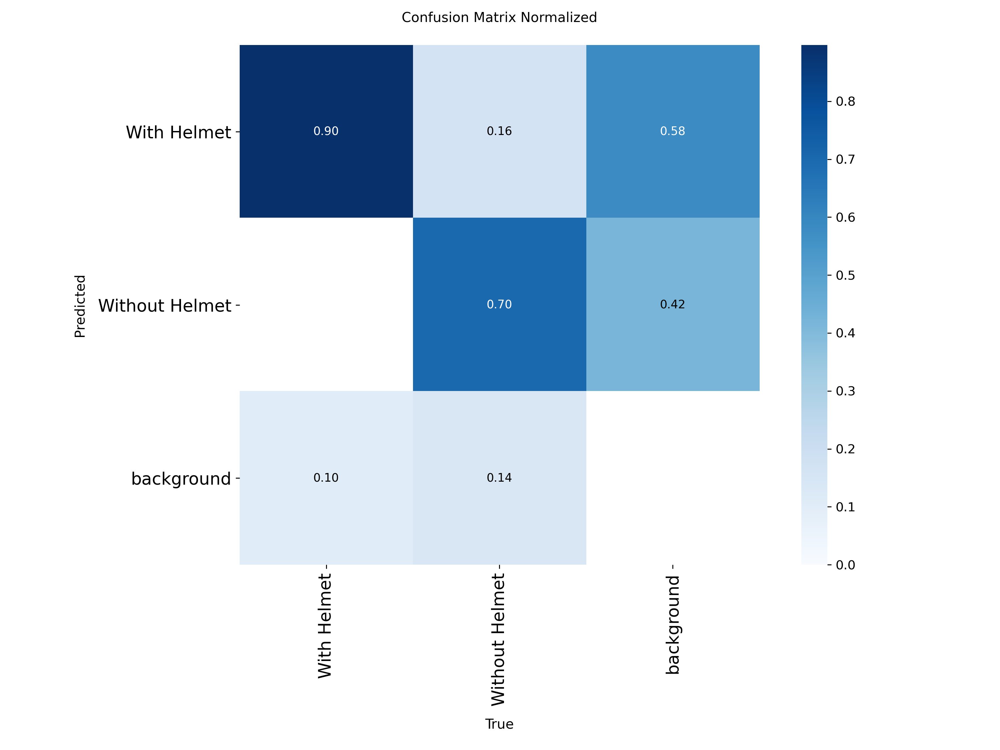

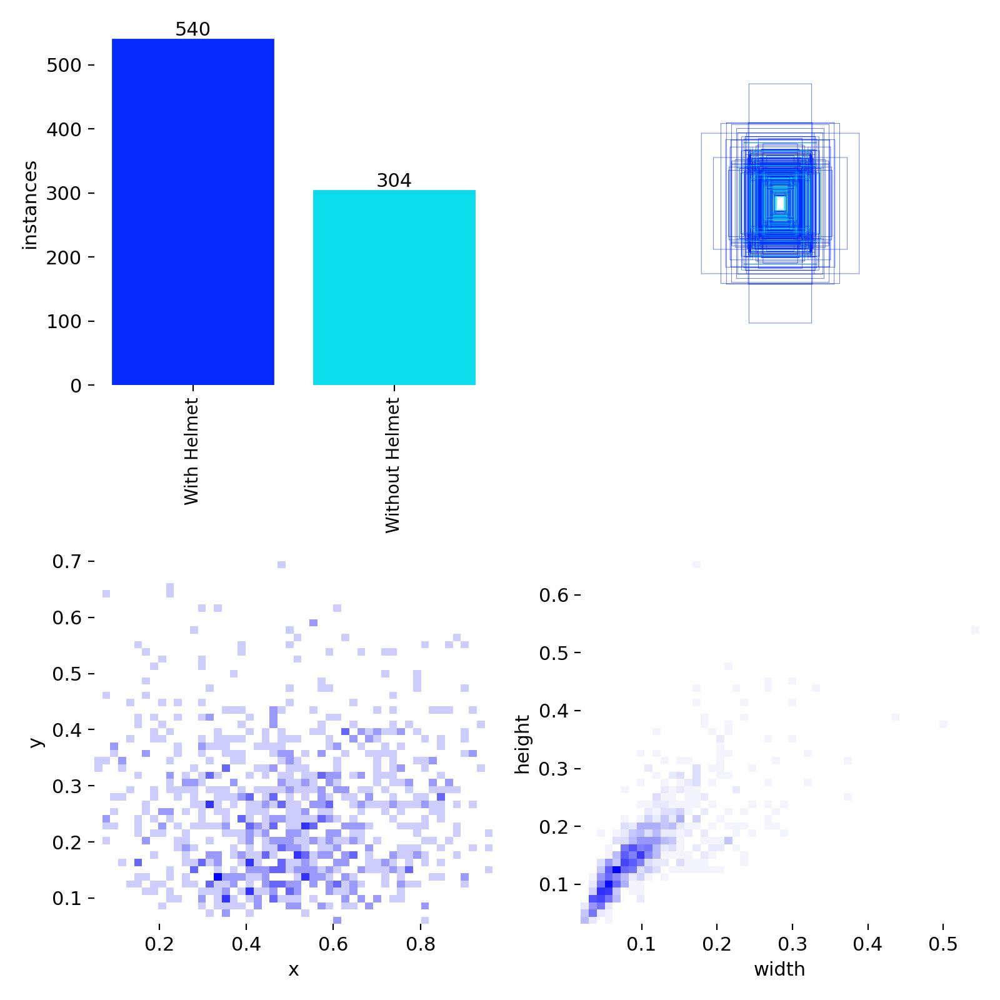

In [11]:
from pathlib import Path
from IPython.display import Image, display

# Define path to the training results folder
results_m_path = Path("runs/detect/train-2")

# Display training results plot (loss curves and metrics over epochs)
display(Image(filename=str(results_m_path / "results.png")))

# Display raw confusion matrix (counts of predictions vs actual classes)
display(Image(filename=str(results_m_path / "confusion_matrix.png")))

# Display normalized confusion matrix (percentages for easier comparison)
display(Image(filename=str(results_m_path / "confusion_matrix_normalized.png")))

# Display sample training images with ground truth labels (data quality check)
display(Image(filename=str(results_m_path / "labels.jpg")))

## Loading Trained YOLOv8(m) Model


In [12]:
from ultralytics import YOLO
from pathlib import Path

# Define path to the best model weights from training
model_m_path = Path("runs/detect/train-2/weights/best.pt")

# Load the trained YOLO model
model_m = YOLO(model_m_path)

print(f"Model loaded successfully from: {model_m_path}")

Model loaded successfully from: runs/detect/train-2/weights/best.pt


## `model_m` Validation Test Results

In [13]:
test_m_results = model_m.val(data="kaggle_data/data.yaml", split="test")

Ultralytics 8.4.80 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 93 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 2.6±4.1 ms, read: 5.1±11.3 MB/s, size: 42.6 KB)
val: Scanning /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/test/labels... 128 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 1.9it/s 1:08
val: New cache created: /content/drive/MyDrive/repos/computer-vision-projects/yolo-helmet-detector/kaggle_data/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.7it/s 4.8s
                   all        128        231      0.739      0.715      0.724      0.422
           With Helmet         98        177      0.808      0.819      0.838      0.541
        Without Helmet         33         54       0.67      0.611      0.609      0.304
Speed: 5.0ms preprocess, 23.5ms inference

## Model Evaluation Results Visualization

Precision: 0.6809
Recall: 0.7409
mAP50: 0.7498
mAP50-95: 0.4661

Precision: 0.7391
Recall: 0.7152
mAP50: 0.7237
mAP50-95: 0.4224


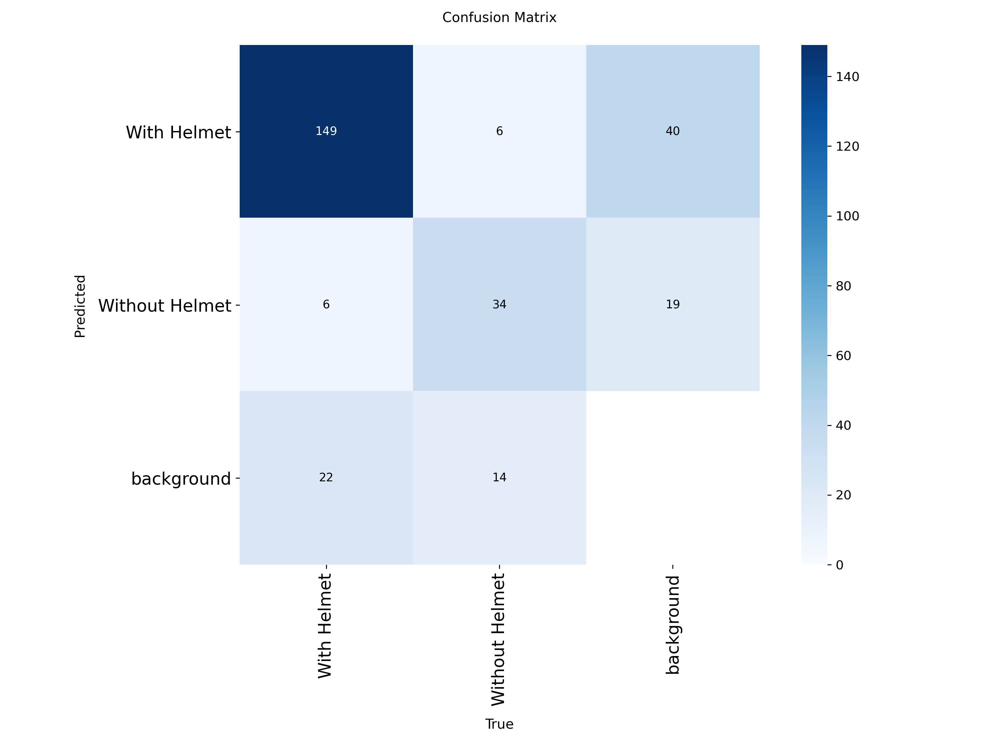

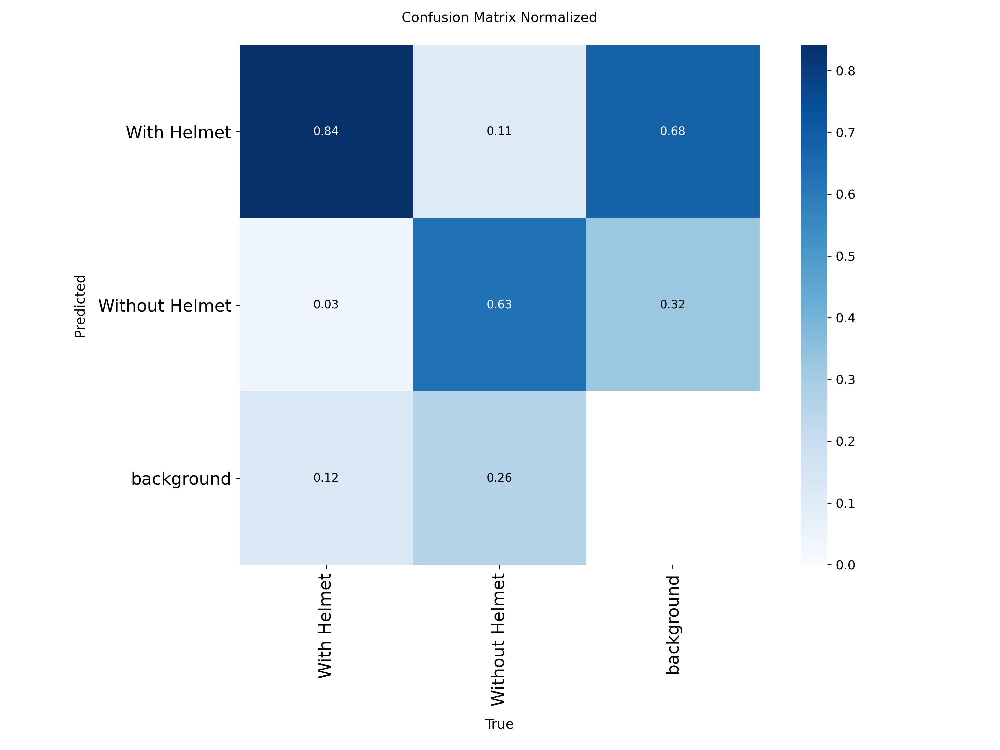

In [15]:
from pathlib import Path
from IPython.display import Image, display

# Define path to the test results folder
test_m_results_path = Path("runs/detect/val-2")

# Print key detection metrics: Precision, Recall, mAP50 and mAP50-95
print(f"Precision: {test_m_results.results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {test_m_results.results_dict['metrics/recall(B)']:.4f}")
print(f"mAP50: {test_m_results.results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP50-95: {test_m_results.results_dict['metrics/mAP50-95(B)']:.4f}")

# Display raw confusion matrix (counts of predictions vs actual classes)
display(Image(filename=str(test_m_results_path / "confusion_matrix.png")))

# Display normalized confusion matrix (percentages for easier comparison)
display(Image(filename=str(test_m_results_path / "confusion_matrix_normalized.png")))

## Per-Class Validation Performance Metrics

In [17]:
from pprint import pprint

print("With Helmet")
pprint(test_m_results.summary()[0])
print("\nWithout Helmet")
pprint(test_m_results.summary()[1])

With Helmet
{'Box-F1': np.float64(0.8137),
 'Box-P': np.float64(0.80826),
 'Box-R': np.float64(0.81921),
 'Class': 'With Helmet',
 'Images': np.int64(98),
 'Instances': np.int64(177),
 'mAP50': np.float64(0.83834),
 'mAP50-95': np.float64(0.54058)}

Without Helmet
{'Box-F1': np.float64(0.6392),
 'Box-P': np.float64(0.66999),
 'Box-R': np.float64(0.61111),
 'Class': 'Without Helmet',
 'Images': np.int64(33),
 'Instances': np.int64(54),
 'mAP50': np.float64(0.609),
 'mAP50-95': np.float64(0.30418)}


## Why Nano Outperformed Medium?

**1. Overfitting (Most Likely)**
- Medium model has **25.9M parameters** (vs 3.2M in Nano)
- More parameters = easier to memorize training data
- Generalizes poorly to validation set

**2. Data Size**
- Dataset is **too small** for Medium
- Nano handles small datasets better (less overfitting)

**3. Training Epochs**
- Medium needs **more epochs** to converge
- Nano converges faster with fewer data

**4. Learning Rate**
- Default LR (0.01) might be too high for Medium
- Try lower LR: `lr0=0.001`

**5. Regularization**
- Medium needs stronger regularization:
  - Higher `weight_decay`
  - More `dropout`
  - More `augmentation`

In [ ]:
test_results_path = Path("runs/detect/val")

# Print key detection metrics: Precision, Recall, mAP50 and mAP50-95
print(f"Precision: {test_results.results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {test_results.results_dict['metrics/recall(B)']:.4f}")
print(f"mAP50: {test_results.results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP50-95: {test_results.results_dict['metrics/mAP50-95(B)']:.4f}")

# Define path to the test results folder
test_m_results_path = Path("runs/detect/val-2")

# Print key detection metrics: Precision, Recall, mAP50 and mAP50-95
print(f"Precision: {test_m_results.results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {test_m_results.results_dict['metrics/recall(B)']:.4f}")
print(f"mAP50: {test_m_results.results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP50-95: {test_m_results.results_dict['metrics/mAP50-95(B)']:.4f}")